
# **TC4033.11**
# Visión computacional para imágenes y video

## Actividad 7
### Algoritmos de extracción de características  | Parte 2

## Prof. Titular
Dr. Gilberto Ochoa Ruiz

## Prof.Tutor
Francisco Solorzano Domínguez

## Equipo 31
### Integrantes
* Juan Felipe Caro Valencia -                   A01796224
* Ada Jimena Vargas Aguirre   -                 A01701619
* Irving Morales Cedeño -                       A01796208
* Marco Polo Navarrete Rodríguez -              A01796238
---


# Learning goal
En cuanto al Colab de Matching, no se espera tampoco que se haga ninguna modificación al código, pero la idea es probar que tan buenos son los diferentes descriptores para hacer matching de imágenes. Se sugiere usar las imágenes con variaciones de iluminación y orientación y ver qué tan bien se hace el matching con Harris por si mismo, o con otros descriptores como SIFT u ORB. Discuta sus hallazgos.

# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
2. [ORB Matching](#orb)
3. [SIFT Matching](#sift)
4. [Conclusion](#conclusion)
5. [Bibliography and references](#bibref)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

from PIL import Image

from matplotlib import image as mpimg
import urllib.request

from google.colab import files
import os, glob

In [2]:
print("Favor de subir el JSON con el API Key de Kaggle")
files.upload()

# Crear directorio de Kaggle y mover el archivo
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

Favor de subir el JSON con el API Key de Kaggle


Saving kaggle.json to kaggle.json


In [3]:
# Descargar datasets necesarios

#### DATASET 1 ###
print("Descarga de Dataset 1")
!mkdir -p /content/data
!kaggle datasets download -d crixsa/kitty-star
!unzip -q kitty-star.zip -d /content/data
!rm kitty-star.zip

Descarga de Dataset 1
Dataset URL: https://www.kaggle.com/datasets/crixsa/kitty-star
License(s): unknown
  0% 0.00/4.57M [00:00<?, ?B/s]
100% 4.57M/4.57M [00:00<00:00, 611MB/s]


# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

## **Prueba 1**

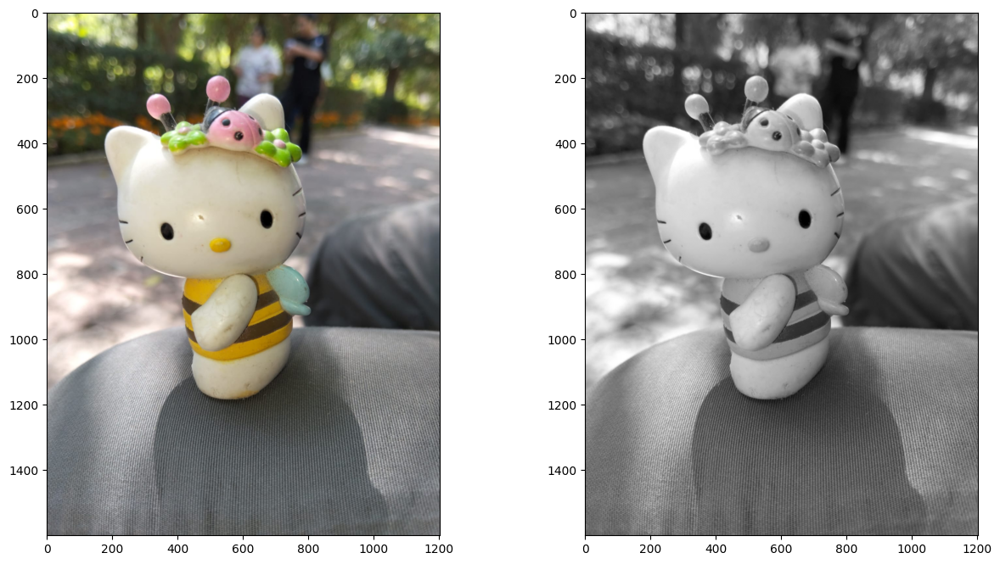

In [4]:
#reading image
img = cv2.imread('data/kitty_bee_ext01.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [5]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

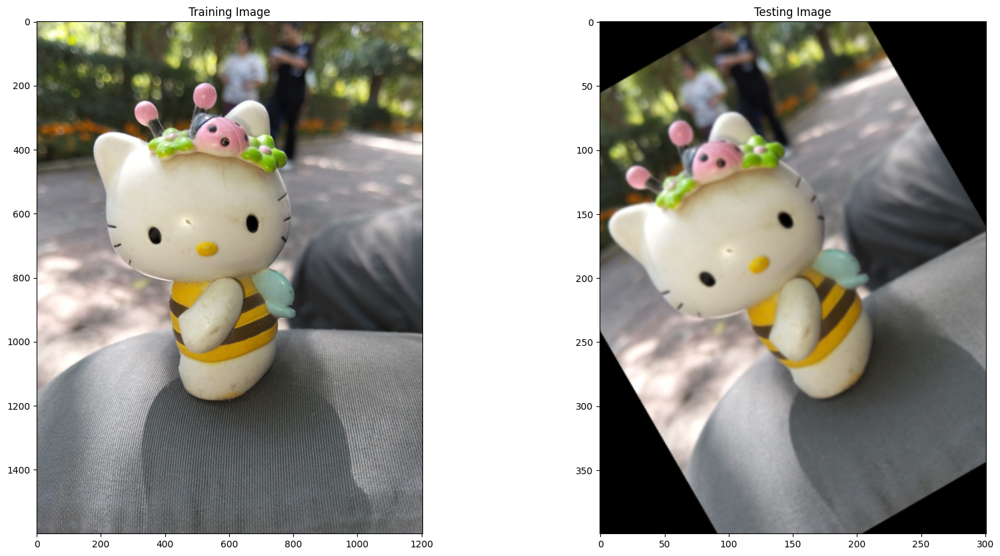

In [6]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [7]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  490


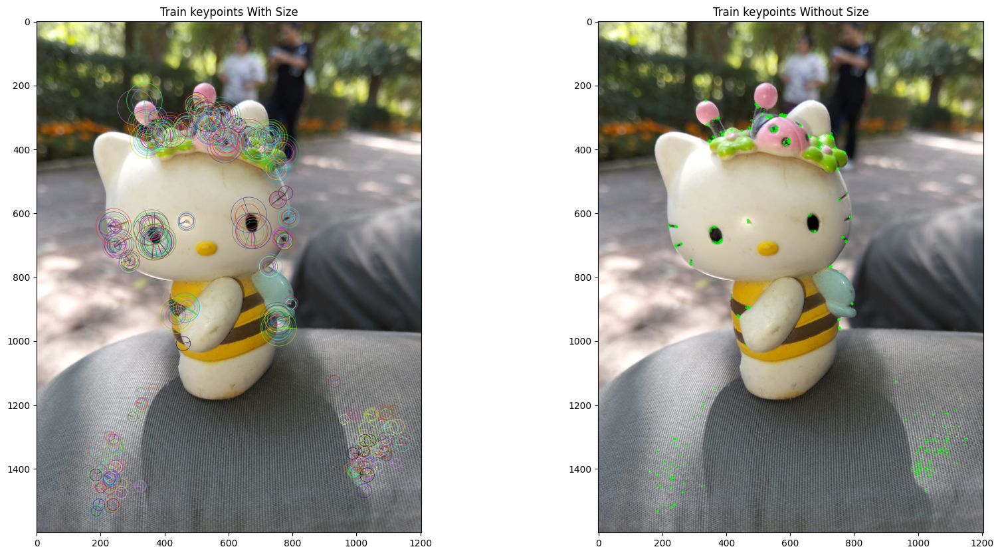

In [8]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

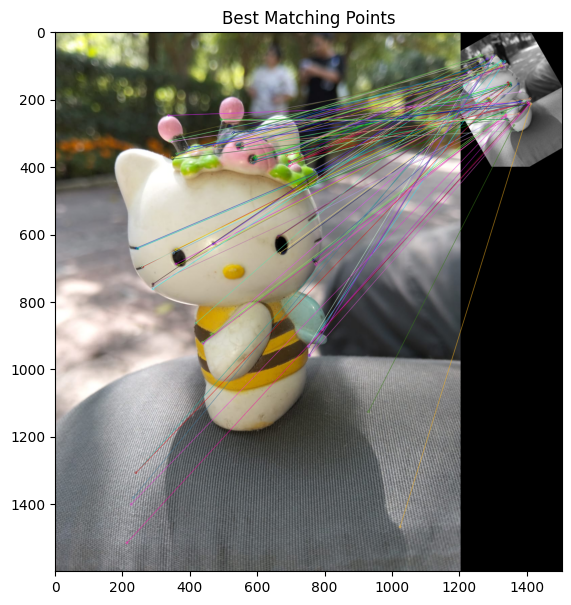


Number of Matching Keypoints Between The Training and Query Images:  106


In [9]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

En este caso se logra apreciar que el algoritmo ORB ha sido capaz de hallar prácticamente los mismos puntos de interés en la imagen original como en la de prueba (la cual está rotada y es más pequeña).

Con este resultado se corrobora que los descriptores de ORB son robustos ante los cambios de escala y rotación.

## **Prueba 2**

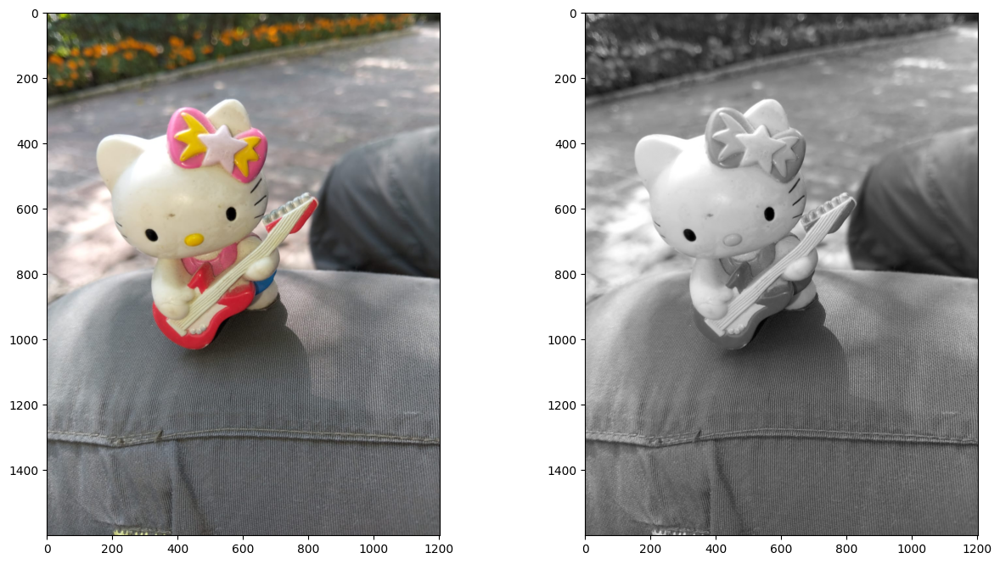

In [10]:
#reading image
img = cv2.imread('data/kitty_guitar_ext00.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

In [11]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

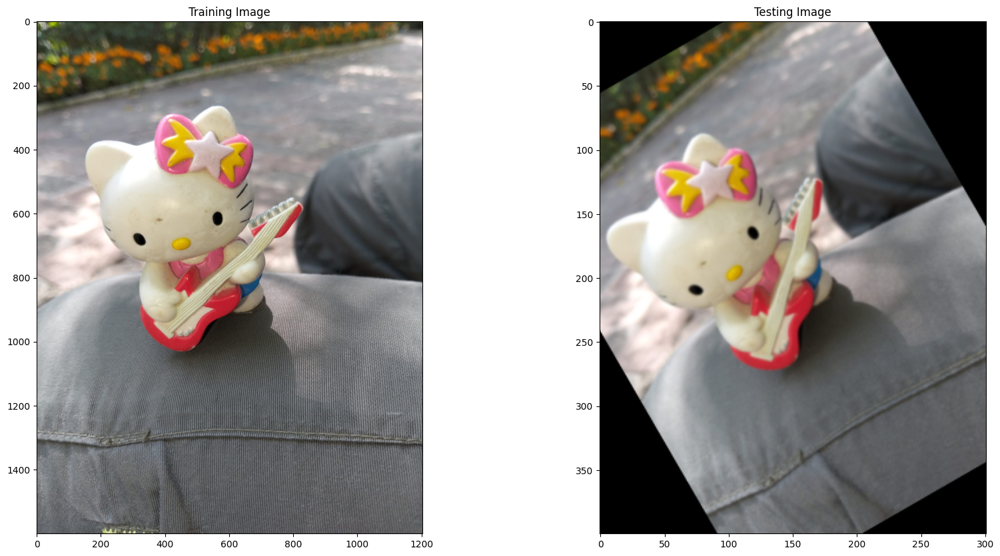

In [12]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

In [13]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  500


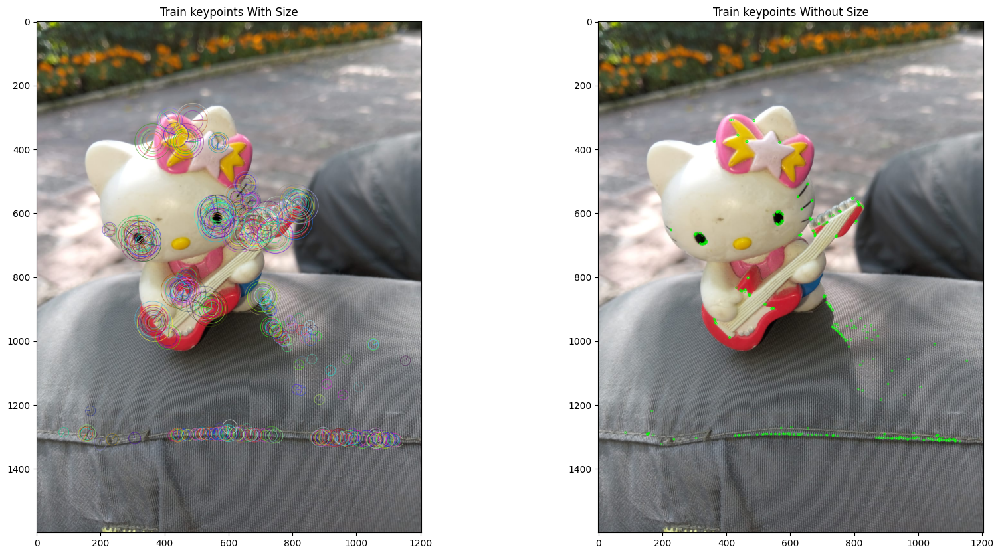

In [14]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

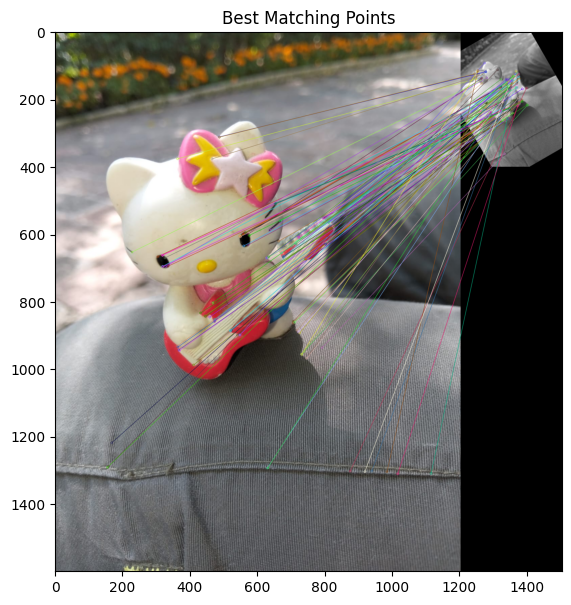


Number of Matching Keypoints Between The Training and Query Images:  100


In [15]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

En esta prueba nuevamente es posible observar que ORB ha encontrado características similares entre la imagen original y la de prueba; no obstante, también se percibe que hay más pares espurios (como los de la costura del pantalón o de su textura).

Con esto presente, se considera que a pesar de la eficiencia de ORB, no es inmune a falsos positivos y si se piensa usar en aplicaciones donde la precisión sea crítica, entonces será necesario aplicar filtros para descartar outliers (ej.: RANSAC) y así únicamente preservar correspondencias consistentes.



# SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

## **Prueba 1**

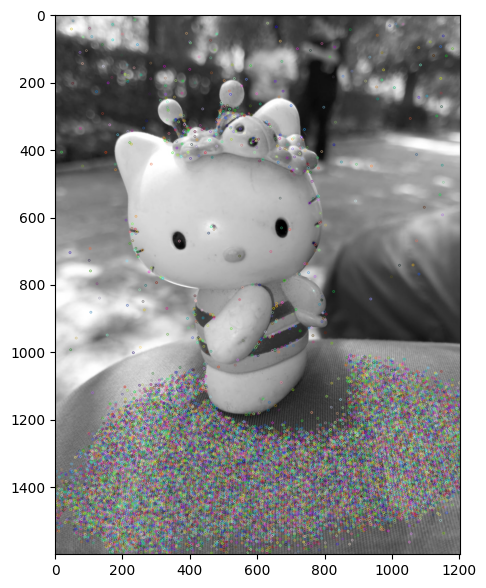

In [16]:
img1 = cv2.imread('data/kitty_bee_ext01.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

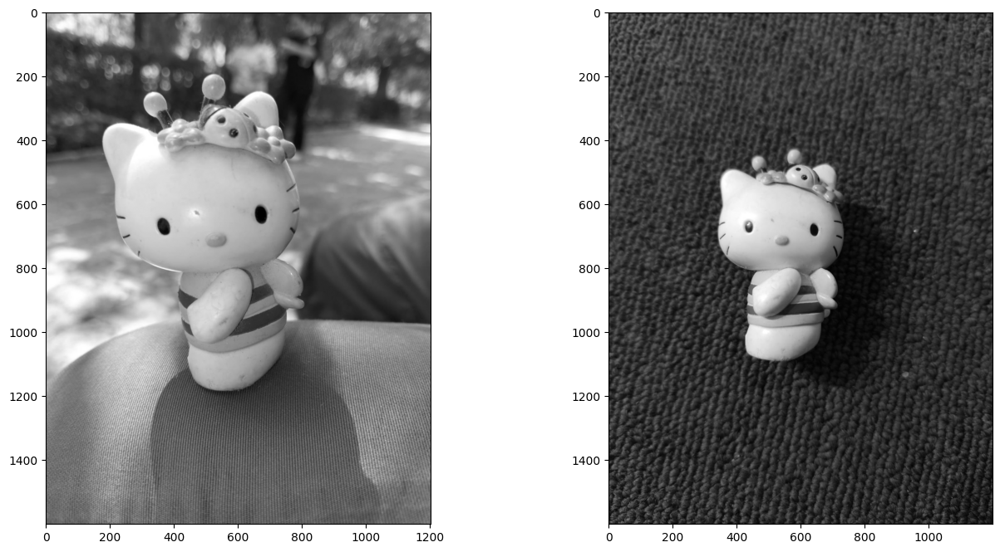

In [17]:
# read images
img1 = cv2.imread('data/kitty_bee_ext01.jpg')
img2 = cv2.imread('data/kitty_bee_carpet01.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [18]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(26335, 6190)

### Feature Matching

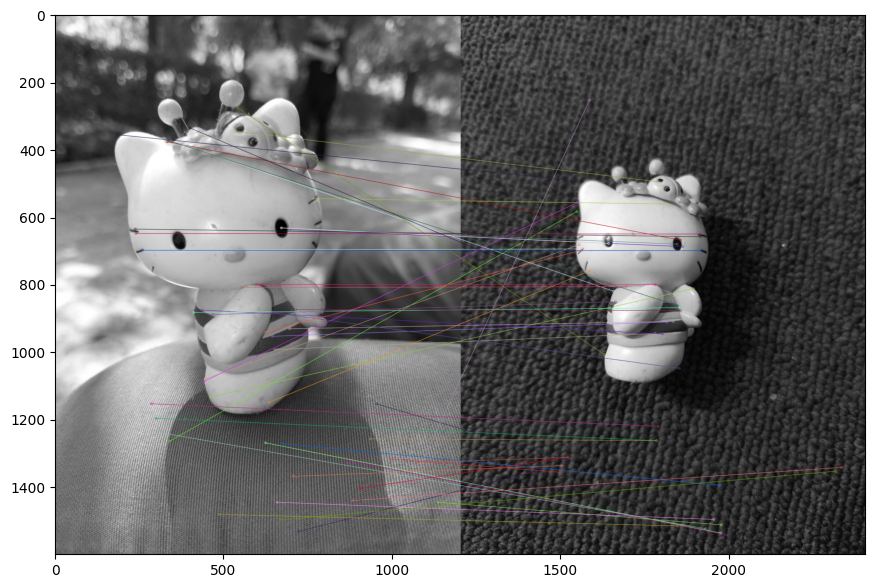

(<matplotlib.image.AxesImage at 0x789c37efe9c0>, None)

In [19]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

El algoritmo SIF permite emparejar características entre dos imágenes diferentes del mismo objeto, a pesar de las diferencias en escalas, rotaciones y fondos.

En esta primera prueba, gracias al parámetro `crossCheck = True` y `bf.match()` es posible eliminar muchos falsos positivos y encontrar los mejores pares. Sin embargo, aún así se observan pares espurios, de nuevo en texturas repetitivas como la del pantalón y la de la alfombra, es por ello que se piensa que este tipo de texturas pueden llevar a generar coincidencias inexistentes ya que producen descriptores parecidos.

## **Prueba 2**

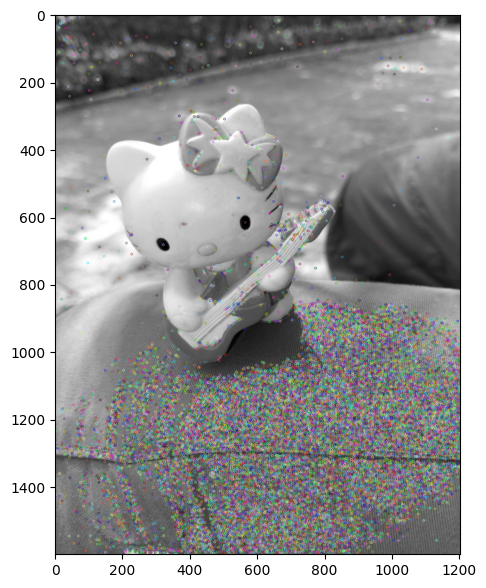

In [20]:
img1 = cv2.imread('data/kitty_guitar_ext00.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

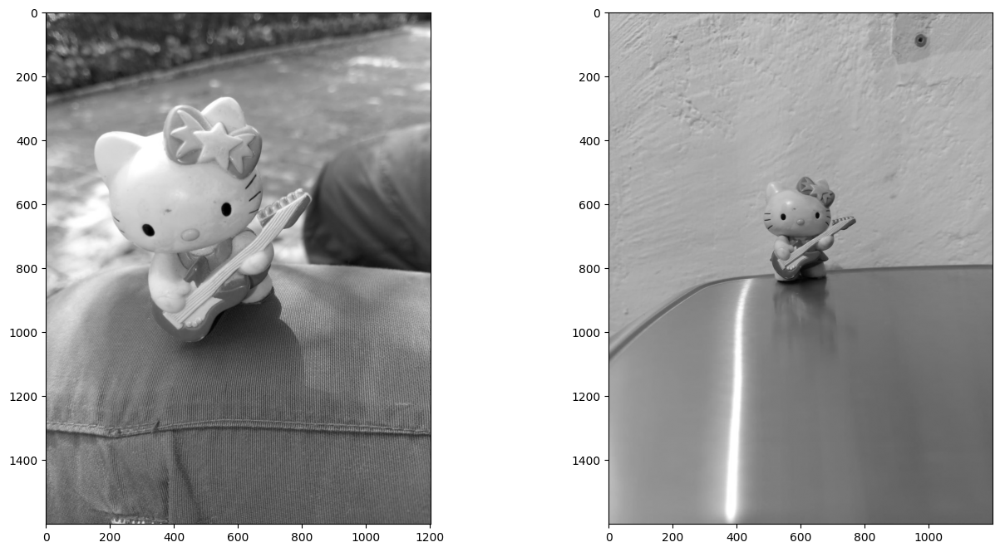

In [21]:
# read images
img1 = cv2.imread('data/kitty_guitar_ext00.jpg')
img2 = cv2.imread('data/kitty_front_f_w.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

In [22]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(35587, 442)

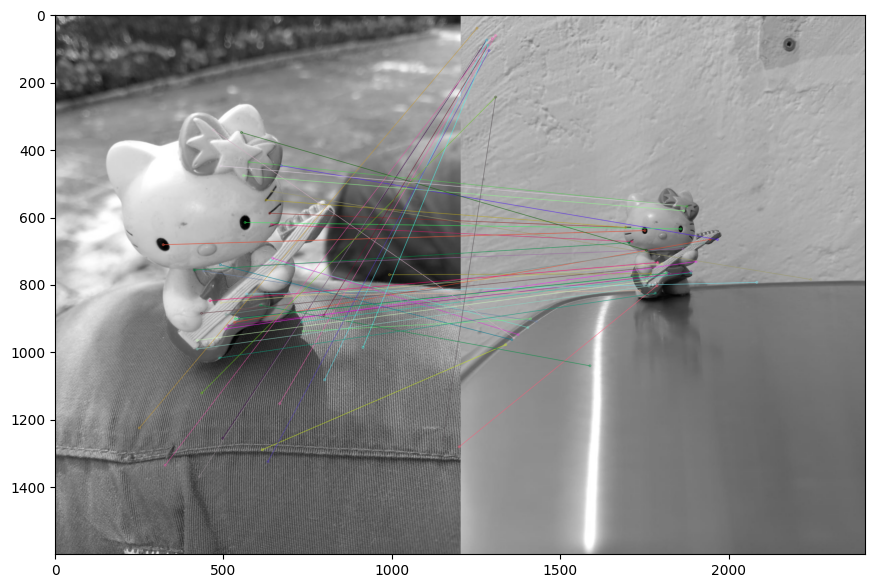

(<matplotlib.image.AxesImage at 0x789c38329e80>, None)

In [23]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

En esta prueba se considera que el emparejamiento de características es, en su mayoría, satisfactorio aunque se observa ruido.

Por un lado, el algoritmo SIFT logra distinguir al objeto en dos imágenes diferentes y demuestra invariancia ante la escala de la muñeca. Por otra parte, se puede ver que varías líneas son incorrectas, en la textura de la imagen de la izquierda con el fondo de la imagen derecha).

Con esto, se concluye que se requieren de filtros como RANSAC para obtener pares útiles y desechar aquellos que no tengan sentido.

# **Conclusion**

Una vez analizados los resultados con el detector de esquinas Harris (notebook separado) y los algoritmos de emparejamiento SIFT y ORB, se pudo observar cómo cada uno tiene sus ventajas y desventajas.

En primer lugar, el detector Harris, por si mismo, no tiene la capacidad de encontrar emparejamiento de caracterísitcas, en sí su única función es identificar en qué coordenadas existe una esquina, no genera ningún tipo de descriptor.

En segundo lugar, SIFT y ORB tienen la capacidad de encontrar puntos clave y crear descriptores, o "huellas", para cada punto. Contar con un descriptor es lo que permite que se use un comparador de fuerza bruta (como BFMatcher) y así encontrar coincidencias.

Como se observó en la actividad, fue posible identificar los mismos objetos en distintas imágenes con fondos y escalas diferentes. Sin embargo, también se tuvo emparejamiento ruidoso, es decir, con pares espurios donde distintas texturas ( como la del pantalón, la pared o la alfombra) se emparejamen erróneamente.

Entonces, se puede concluir que aunque los algortimos SIFT y ORB son eficientes, no son infalibles en áreas con texturas repetitivas pues se produjeron falsos positivos. Por ende, es importante tener presente que al generar emparejamientos la primera vez, estos deberían considerarse como candidatos para después aplicar un filtrado que valide a dichos candidatos y así se tenga un resultado fiable.


# **Bibliography and references**

* Dasgupta, S. (2020, 31 de enero). *Outlier detection using the RANSAC algorithm*. Medium. https://medium.com/@saurabh.dasgupta1/outlier-detection-using-the-ransac-algorithm-de52670adb4a

* Gonzalez, R. C., y Woods, R. E. (2018). Digital Image Processing, Global Edition (4th ed.). Pearson International Content. https://tec.vitalsource.com/books/9781292223070

* Learned-Miller, E.G. (2005). *Feature Matching and RANSAC*. https://people.cs.umass.edu/~elm/Teaching/ppt/370/370_10_RANSAC.pptx.pdf

* Solem, J.E.. (2012). *Programming Computer Vision with Pyhton*. O'Reilly Media, Inc. https://learning.oreilly.com/library/view/programming-computer-vision/9781449341916
